In [1]:
from zlib import compress,decompress
import os
from PIL import Image
from array import array
import random

In [2]:
#uncomment the below line and enter desired directory
#testdir = [directory]

# gets a "warped average" of the surrounding pixels. If the pixel index exists, it finds the value of pixels to the 
# left and right of the original pixel, as well as rows above and below said pixel. It also finds pixels that 
# have been shifted by a number equal to the image's height. It averages the r,g, and b values for these pixels and
# returns the tuple. 

def avesurround(image,pixelnum,imsize): 
    left = pixelnum - 1
    right = pixelnum + 1
    up = pixelnum - imsize[0]
    down = pixelnum - imsize[0]
    in_up = pixelnum - imsize[1]
    in_down = pixelnum + imsize[1]
    inran = lambda num,size: num >= 0 and num < (imsize[0] * imsize[1])
    #outnum = [left,right,in_up,in_down,pixelnum,up,down]
    outnum = [up,down,pixelnum]
    outnum = [image[i] for i in outnum if inran(i,imsize)]
    #print(outnum)
    outave = tuple([int(sum([list(outnum[j])[k] for j in range(len(outnum))])%255) for k in range(3)])
    return outave 

# gets the data from the image, creates a new image. For each pixel in the old image, it uses avesurround to get 
# a slightly warped average of the surrounding pixels, then turns that into a tuple and adds it to the new image. 



def barely_recognizable(im):
    a = im.getdata()
    outlist = []
    newimg = Image.new('RGB',im.size)
    for pixel in range(len(a)): 
        outave = avesurround(a,pixel,im.size)
        [r,g,b] = [outave[k] for k in range(3)]
        outlist.append((r,g,b))
    newimg.putdata(outlist)
    return newimg


# Goes through folder, finds any image that ends in 'jpg' or 'jpeg', opens/loads it, runs it through barely_recognizable
#  converts it to RGB, adds "_proc" to the end of the filename, then saves it. 

def folder_proc(testdir):
    os.chdir(testdir)
    direct = os.listdir()
    for i in direct: 
        [name,extend] = [j for j in i.split('.')]
        if extend.lower() in ['jpg','jpeg'] and '_proc' not in name: # included exception for already processed files for ease of testing
            im = Image.open(i)
            im = im.convert('RGB')
            print(im.mode)
    #im.show()
            wid = im.size[0]
            hei = im.size[1]
            data=b"\25"*(wid*hei*3)
            im2=Image.frombuffer(im.mode,im.size,data,'raw',im.mode,0,1)
            pix=im.load()
            newimg = barely_recognizable(im)
            #newimg = newimg.convert('RGB')
            newimg.save(name + '_proc.' + extend)
            im.close()
            
folder_proc(testdir)

NameError: name 'testdir' is not defined

before
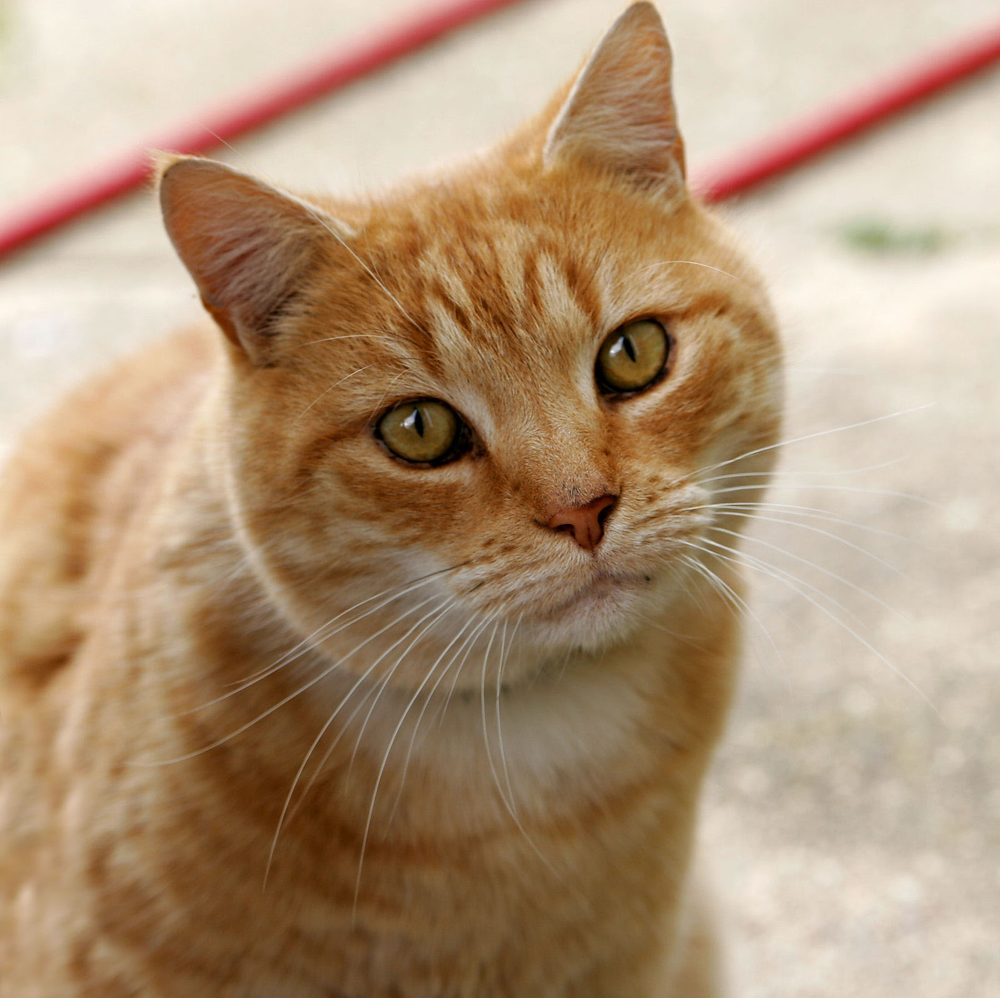

after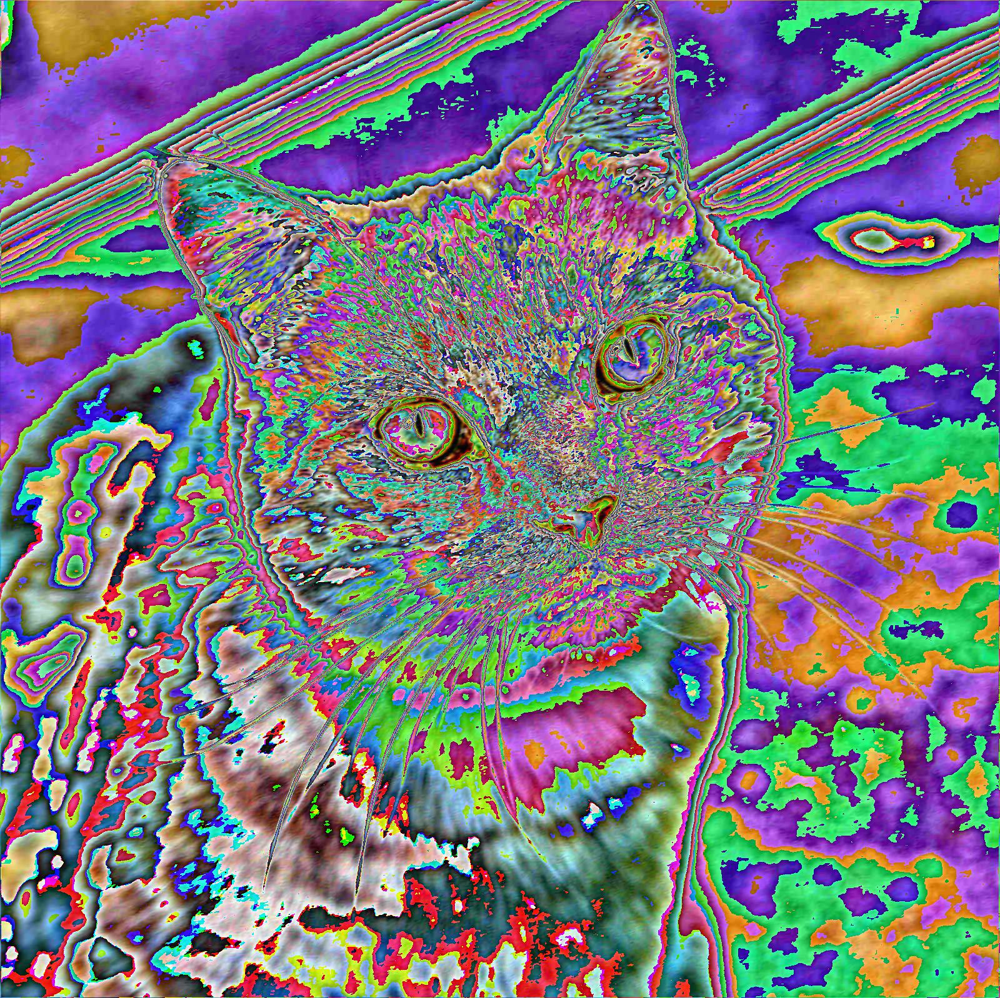

In [26]:
#def artdeco(pixel):
#    (a,b,c) = pixel
#    dist = ((a**2 + b ** 2) ** 0.5 + c**2)**0.5
#    cutoff = 150
#    if dist < cutoff:
#        return (0,0,0)
#    else: 
#        return (255,213,0)

#def decofy(im):
#    a = im.getdata()
#    outlist = []
#    newimg = Image.new('RGB',im.size)
#    for pixeldex in range(len(a)): 
#        pixel = a[pixeldex]
#        decopix = artdeco(pixel)
#        outlist.append(decopix)
#    newimg.putdata(outlist)
#    return newimg

#testdir = insert desired directory here. 